# Technical Test Mohammed FAQIHI

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from pandas_profiling import ProfileReport
import pandas_profiling
import matplotlib.pyplot as plt

Reading data and first observations

In [2]:
df=pd.read_csv('train_auto.csv')
df

,INDEX,TARGET_FLAG,TARGET_AMT,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,SEX,EDUCATION,JOB,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CAR_AGE,URBANICITY
0,1,0,0.0,0,60.0,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,"$14,230",11,Minivan,yes,"$4,461",2,No,3,18.0,Highly Urban/ Urban
1,2,0,0.0,0,43.0,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,"$14,940",1,Minivan,yes,$0,0,No,0,1.0,Highly Urban/ Urban
2,4,0,0.0,0,35.0,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,"$4,010",4,z_SUV,no,"$38,690",2,No,3,10.0,Highly Urban/ Urban
3,5,0,0.0,0,51.0,0,14.0,NaN,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,"$15,440",7,Minivan,yes,$0,0,No,0,6.0,Highly Urban/ Urban
4,6,0,0.0,0,50.0,0,NaN,"$114,986",No,"$243,925",Yes,z_F,PhD,Doctor,36,Private,"$18,000",1,z_SUV,no,"$19,217",2,Yes,3,17.0,Highly Urban/ Urban
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8156,10297,0,0.0,0,35.0,0,11.0,"$43,112",No,$0,z_No,M,z_High School,z_Blue Collar,51,Commercial,"$27,330",10,Panel Truck,yes,$0,0,No,0,8.0,z_Highly Rural/ Rural
8157,10298,0,0.0,1,45.0,2,9.0,"$164,669",No,"$386,273",Yes,M,PhD,Manager,21,Private,"$13,270",15,Minivan,no,$0,0,No,2,17.0,Highly Urban/ Urban
8158,10299,0,0.0,0,46.0,0,9.0,"$107,204",No,"$332,591",Yes,M,Masters,NaN,36,Commercial,"$24,490",6,Panel Truck,no,$0,0,No,0,1.0,Highly Urban/ Urban
8159,10301,0,0.0,0,50.0,0,7.0,"$43,445",No,"$149,248",Yes,z_F,Bachelors,Home Maker,36,Private,"$22,550",6,Minivan,no,$0,0,No,0,11.0,Highly Urban/ Urban


We do have a dataset with 26 variables and 8161 rows, our taget is **TARGET_FLAG**, which is binary variable that makes two classes of costumers based on features related mainly to social statues, some car related features and history of claims. 

The first variable **INDEX**, that indicates the index of observation can be droped.



In [3]:
df = df.drop(['INDEX'], axis=1)

In [4]:
df.dtypes

TARGET_FLAG      int64
TARGET_AMT     float64
KIDSDRIV         int64
AGE            float64
HOMEKIDS         int64
YOJ            float64
INCOME          object
PARENT1         object
HOME_VAL        object
MSTATUS         object
SEX             object
EDUCATION       object
JOB             object
TRAVTIME         int64
CAR_USE         object
BLUEBOOK        object
TIF              int64
CAR_TYPE        object
RED_CAR         object
OLDCLAIM        object
CLM_FREQ         int64
REVOKED         object
MVR_PTS          int64
CAR_AGE        float64
URBANICITY      object
dtype: object

We observe that some variables **(INCOME, HOME_VAL, BLUEBOOK, OLDCLAIM)** are in wrong format. They countain a '$' sign and should converted to float format.

Now let's check Nan values

In [5]:
df.isna().sum() / len(df) * 100

TARGET_FLAG    0.000000
TARGET_AMT     0.000000
KIDSDRIV       0.000000
AGE            0.073520
HOMEKIDS       0.000000
YOJ            5.563044
INCOME         5.452763
PARENT1        0.000000
HOME_VAL       5.685578
MSTATUS        0.000000
SEX            0.000000
EDUCATION      0.000000
JOB            6.445289
TRAVTIME       0.000000
CAR_USE        0.000000
BLUEBOOK       0.000000
TIF            0.000000
CAR_TYPE       0.000000
RED_CAR        0.000000
OLDCLAIM       0.000000
CLM_FREQ       0.000000
REVOKED        0.000000
MVR_PTS        0.000000
CAR_AGE        6.249234
URBANICITY     0.000000
dtype: float64

the percentage of nan values in our data set is below 10% for all variables. so we'll keep all variables.

We'll first modify columns that contains a '$' sign

In [6]:
DOLLARS_COLUMNS = ['INCOME','HOME_VAL','BLUEBOOK','OLDCLAIM']
def prepare_dollar_columns(dataframe, columns= DOLLARS_COLUMNS):
  """
  Prepare columns representing amount of money stored in string with a dollar sign to float values.
  """
  for column in columns :
    if dataframe[column].dtypes == object :
      dataframe[column]=dataframe[column].replace(['\$', ','],['','.'], regex = True)
      dataframe[column] = pd.to_numeric(dataframe[column], downcast="float")
  return dataframe

In [7]:
df = prepare_dollar_columns(df)

In [8]:
df.describe()

,TARGET_FLAG,TARGET_AMT,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,HOME_VAL,TRAVTIME,BLUEBOOK,TIF,OLDCLAIM,CLM_FREQ,MVR_PTS,CAR_AGE
count,8161.000000,8161.000000,8161.000000,8155.000000,8161.000000,7707.000000,7716.000000,7697.000000,8161.000000,8161.000000,8161.000000,8161.000000,8161.000000,8161.000000,7651.000000
mean,0.263816,1504.324648,0.171057,44.790313,0.721235,10.499286,64.757843,154.867218,33.485725,15.709902,5.351305,13.313160,0.798554,1.695503,8.328323
std,0.440728,4704.026930,0.511534,8.627589,1.116323,4.092474,60.768658,129.123962,15.908333,8.419724,4.146635,85.537788,1.158453,2.147112,5.700742
min,0.000000,0.000000,0.000000,16.000000,0.000000,0.000000,0.000000,0.000000,5.000000,1.500000,1.000000,0.000000,0.000000,0.000000,-3.000000
25%,0.000000,0.000000,0.000000,39.000000,0.000000,9.000000,28.696251,0.000000,22.000000,9.280000,1.000000,0.000000,0.000000,0.000000,1.000000
50%,0.000000,0.000000,0.000000,45.000000,0.000000,11.000000,54.799500,161.160004,33.000000,14.440000,4.000000,0.000000,0.000000,1.000000,8.000000
75%,1.000000,1036.000000,0.000000,51.000000,1.000000,13.000000,87.259003,238.723999,44.000000,20.850000,7.000000,4.906000,2.000000,3.000000,12.000000
max,1.000000,107586.136200,4.000000,81.000000,5.000000,23.000000,997.000000,885.281982,142.000000,69.739998,25.000000,999.000000,5.000000,13.000000,28.000000


In [9]:
df.describe(include = 'O')

,PARENT1,MSTATUS,SEX,EDUCATION,JOB,CAR_USE,CAR_TYPE,RED_CAR,REVOKED,URBANICITY
count,8161,8161,8161,8161,7635,8161,8161,8161,8161,8161
unique,2,2,2,5,8,2,6,2,2,2
top,No,Yes,z_F,z_High School,z_Blue Collar,Private,z_SUV,no,No,Highly Urban/ Urban
freq,7084,4894,4375,2330,1825,5132,2294,5783,7161,6492


We'll do a profile reporting of our data

In [10]:
df.profile_report()

Summarize dataset:   0%|          | 0/38 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

*  As we can see regarding our target, **'TARGET_FLAG'** data is unbalanced between class 0 and class 1. we'll have to deal with this first problem.

*   we observe a high correlation beween **'TARGET_FLG'** and **'TARGET_AMT'**

*   we observe a high correlation beween **'INCOME'**, **'EDUCATION'** and **'HOME_VAL'**



In [11]:
def show_percentage(ax, size= 12):
  '''
  a function that shows the percentage of a class in a countplot
  '''
  bars = ax.patches
  half = int(len(bars)/2)
  left_bars = bars[:half]
  right_bars = bars[half:]

  for left, right in zip(left_bars, right_bars):
    height_l = left.get_height()
    height_r = right.get_height()
    total = height_l + height_r

    ax.text(left.get_x() + left.get_width()/2., height_l + 40, '{0:.0%}'.format(height_l/total), ha="center", fontsize=size)
    ax.text(right.get_x() + right.get_width()/2., height_r + 40, '{0:.0%}'.format(height_r/total), ha="center", fontsize=size)

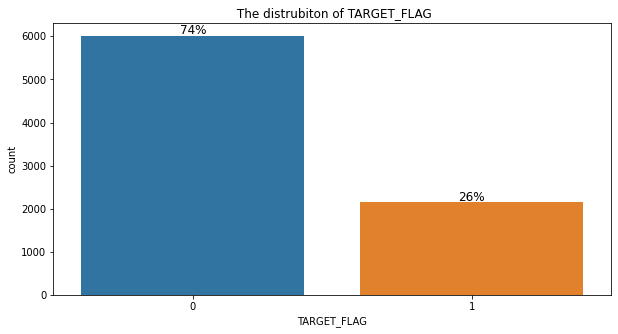

In [12]:
DataFrame = df[["TARGET_FLAG","TARGET_AMT"]]
fig, ax = plt.subplots(figsize=(10,5))
sns.countplot( x = DataFrame["TARGET_FLAG"])
plt.title(" The distrubiton of TARGET_FLAG")
show_percentage(ax)


*  As We said earlier our data is highly unbalanced regarding 'TARGET_FLAG' feature. class 1 is represented by 26% however class 0 by 74%. we might have to use some under-samlping or oversampling methods.

In [13]:
np.sum((DataFrame.TARGET_FLAG == 0) == (DataFrame.TARGET_AMT == 0))==df.shape[0] 

True

In the cell above we checked that  the variable **'TARGET_FLG'** is set to 1 whenever **'TARGET_AMT'** is positive, and **'TARGET_FLG'** is set to 0 whenever **'TARGET_AMT'** is null. 
So we're going to drop **'TARGET_AMT'** variable.


## Data analysis

Let's study the relationship between our target and some features.



### Relationship between TARGET_FLAG and Numerical features

We'll start by numerical features, then categorical and binary features.

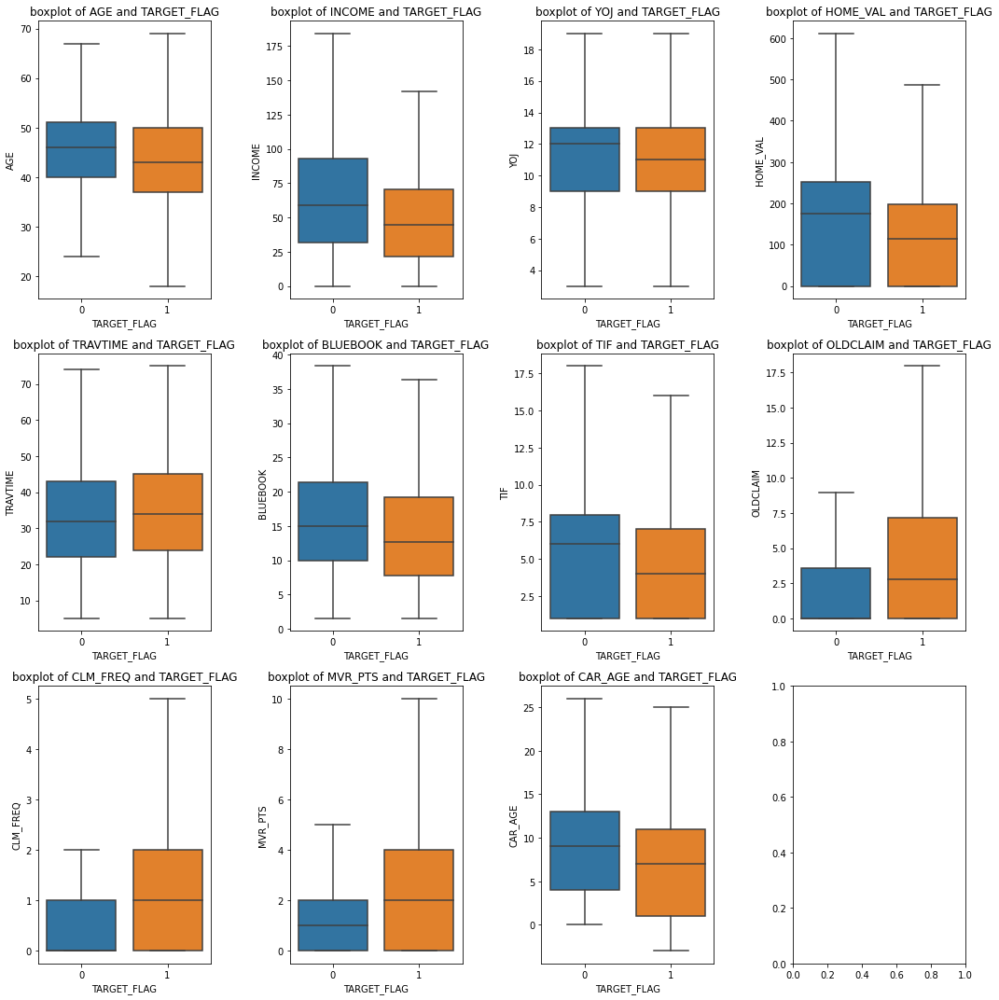

In [14]:
numerical_features=['AGE', 'INCOME', 'YOJ', 
                       'HOME_VAL', 'TRAVTIME', 'BLUEBOOK',
                       'TIF', 'OLDCLAIM', 'CLM_FREQ',
                       'MVR_PTS', 'CAR_AGE']

fig, axes = plt.subplots(3,4, figsize=(15,15))

for name, ax in zip(numerical_features, axes.flatten()):
    sns.boxplot(y=name, x= "TARGET_FLAG", data=df, orient='v', ax=ax, showfliers = False)
    ax.set_title("boxplot of "+name+" and TARGET_FLAG") 
    
plt.tight_layout()

We do observe that some features like 'MVR_PTS', 'OLD_CLM' and 'CLM_FREQ' do have some impact on target class. High values in 'MVR_PTS', 'CLM_FREQ' and 'OLDCLAIM' imply individuals to be more likely in class 1. 

Some features like 'INCOME' and 'HOME_VAL' may also have an impact on target class. High value in 'INCOME' and 'HOME_VAL' imply individuals to be more likely in class 0.

In [15]:
df['CAR_AGE'][df['CAR_AGE'] <= 0] = int(df['CAR_AGE'].mean())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


### Categorical features

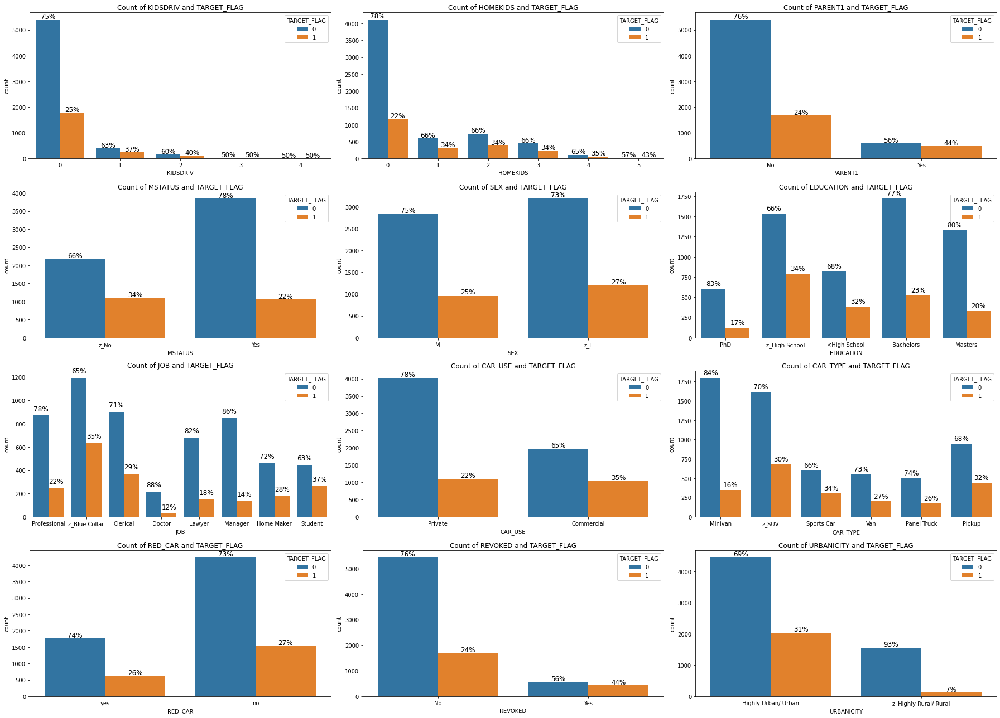

In [16]:
object_columns = [ 'KIDSDRIV', 'HOMEKIDS', 'PARENT1', 'MSTATUS', 'SEX', 'EDUCATION',
       'JOB', 'CAR_USE', 'CAR_TYPE', 'RED_CAR', 'REVOKED', 'URBANICITY']


fig, axes = plt.subplots(4,3, figsize=(25,18))

for name, ax in zip(object_columns, axes.flatten()):
  sns.countplot(ax = ax, data= df, x= name, hue= "TARGET_FLAG")   
  ax.set_title("Count of "+name+" and TARGET_FLAG") 
  show_percentage(ax)
plt.tight_layout()

#plt.show()




*  We can observe the more Kids you have specially those who can drive the more the chance of being in class 1 (risky). the risk increases significantly when you we move from 0 kid to more than 1.

*  As for the number of invdividuals in class 1, we observe a high concentration for the class High School and $<$High School, we do also abserve a low concentration for 'Doctor', 'Lawyer', or 'Manager' classes. 


*  when the 'URBANCITY' feature is set to 'highly Urban/Urban', the probability to be in class 1 is high.

*  when the 'REVOKED' feature is set to 'Yes', individuals are more likely to be in class 1.

*  when the 'PARENT1' feature is set to 'Yes'n individuals are more likely to be in class 1.

*  when the 'Mstatus' feature is set to 'No' the individuals are more likely to be in class 1.

*  We can see that the sport cars have the biggest proportion being classified as risky(34%) followed by pickup that have a proportion of 32%. Minivan have a small proportion maybe because they are used by families.

# Build a model

### First learning

construction of train and test sets

In [19]:
df=pd.read_csv('train_auto.csv')

In [22]:
from sklearn.model_selection import train_test_split

X_df=df
y = X_df.TARGET_FLAG
X_df = X_df.drop(columns=['INDEX','TARGET_FLAG', 'TARGET_AMT'])
random_state = 1
X_train, X_test, y_train,y_test = train_test_split(X_df, y, test_size=0.3, random_state=random_state)

In [23]:
def dollar_transform(df):
  columns=df.columns
  return prepare_dollar_columns(df, columns)

We're going to use a random forest model as classifier, as we have an imbalanced data.

In [24]:
print("The proportion of class 1 of the total set ",np.mean(y)*100, '%')
print("The proportion of class 1 of the training set ",np.mean(y_train)*100, '%')
print("The proportion of class 1 of the testing set ",np.mean(y_test)*100, '%')

The proportion of class 1 of the total set  26.38157088592084 %
The proportion of class 1 of the training set  26.383053221288517 %
The proportion of class 1 of the testing set  26.378113515720703 %


we do check the proportion of each class in train and test set, in order to avoid the situation where a set contains representations of a class more than the other

In [25]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [26]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, FunctionTransformer
from sklearn.compose import make_column_transformer
from sklearn.compose import ColumnTransformer

numerical_columns=numerical_features
binary_columns=['PARENT1', 'MSTATUS', 'SEX', 'CAR_USE', 'RED_CAR', 'REVOKED', 'URBANICITY']
cat_columns=['KIDSDRIV', 'HOMEKIDS', 'EDUCATION', 'JOB', 'CAR_TYPE']

transformer=FunctionTransformer(dollar_transform)

numeric_transformer = Pipeline(steps=[
    ('transformer', transformer),
    ('imputer', SimpleImputer(strategy= 'median')),
    ('scaler', StandardScaler())])

binary_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OrdinalEncoder())])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder())])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_columns),
        ('bin', binary_transformer, binary_columns),
        ('cat', categorical_transformer, cat_columns)])

#clf1 = Pipeline(steps=[('preprocessor', preprocessor),
#                      ('classifier', RandomizedSearchCV(estimator = RandomForestClassifier(class_weight="balanced"), 
#                                                        param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, 
#                                                        random_state=42, n_jobs = -1))])

# Use the random grid to search for best hyperparameters
#clf1.fit(X_train, y_train)

this method is very time consuming. so we're going to use default parameter for randomforest model in next steps.

In [27]:
#args = clf1.get_params()['classifier'].best_params_
#args

In [28]:
clf1 = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier',RandomForestClassifier(class_weight="balanced"))])
clf1.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('transformer',
                                                                   FunctionTransformer(accept_sparse=False,
                                                                                       check_inverse=True,
                                                                                       func=<function dollar_transform at 0x7f0f2f5e7290>,
                                                                                       inv_kw_args=None,
                                                                                       inve

In [29]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, recall_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
ac={}
y_pred = clf1.predict(X_test)
cv_score = cross_val_score(clf1, X_df, y, cv=10, scoring='roc_auc')
print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, y_pred))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, y_pred))
print('\n')
print("=== All AUC Scores ===")
print(cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - Random Forest: ", cv_score.mean())
ac["Unbalanced_Random_Forest"] = cv_score.mean()


=== Confusion Matrix ===
[[1714   89]
 [ 442  204]]


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.79      0.95      0.87      1803
           1       0.70      0.32      0.43       646

    accuracy                           0.78      2449
   macro avg       0.75      0.63      0.65      2449
weighted avg       0.77      0.78      0.75      2449



=== All AUC Scores ===
[0.80626425 0.80590102 0.81314476 0.82674612 0.78837983 0.7980072
 0.81875943 0.8317378  0.81586034 0.7967284 ]


=== Mean AUC Score ===
Mean AUC Score - Random Forest:  0.8101529145396252


In [30]:
columns = numerical_columns + binary_columns +  cat_columns

In [31]:
enc_cat_features = preprocessor.named_transformers_['cat']['onehot'].get_feature_names(cat_columns)
labels = np.concatenate([numerical_columns, binary_columns, enc_cat_features])

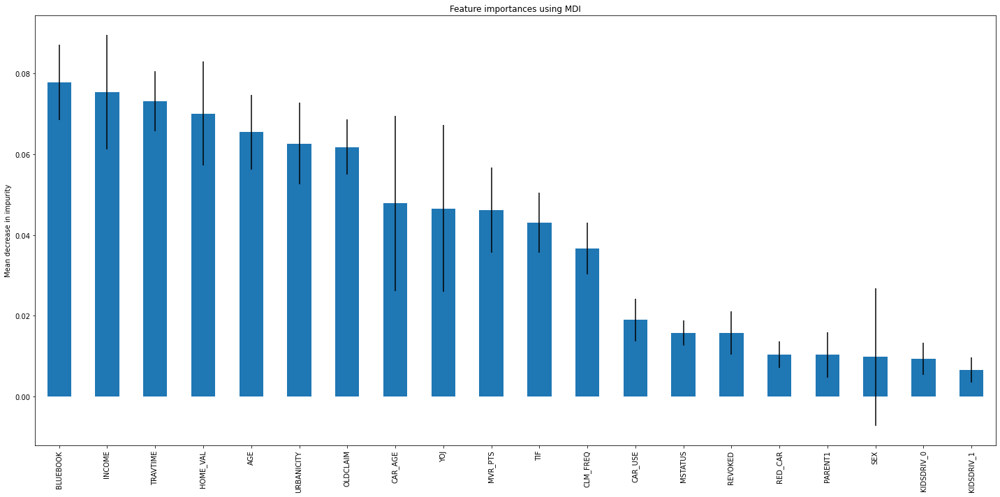

In [32]:
importance =  clf1.get_params()['classifier'].feature_importances_
std = np.std([
    tree.feature_importances_ for tree in clf1.get_params()['classifier'].estimators_], axis=0)

forest_importances = pd.Series(importance, index=labels)[:20]

fig, ax = plt.subplots(figsize=(20,10))
forest_importances.sort_values(axis=0, ascending=False).plot.bar(yerr=std[:20], ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

We do observe that the most relevant features in the training BLUEBOOK, INCOME, and HOME_VAL

## Oversampling

To deal with Deal with imbalanced data we're going to use an oversampling method that consist of creating new individuals use KNN algorithms.

In [33]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTENC
from collections import Counter
from imblearn.pipeline import make_pipeline
from imblearn.combine import SMOTEENN


numeric_transformer1 = Pipeline(steps=[
    ('transformer', transformer),
    ('imputer', SimpleImputer(strategy= 'median'))])

binary_transformer1 = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent'))])

categorical_transformer1 = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing'))])

preprocessor1 = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer1, numerical_columns),
        ('bin', binary_transformer1, binary_columns),
        ('cat', categorical_transformer1, cat_columns)])


X_df_balanced=df
y = X_df_balanced.TARGET_FLAG
X_df_balanced = X_df_balanced.drop(columns=['INDEX','TARGET_FLAG', 'TARGET_AMT'])
random_state = 1
X_train, X_test, y_train,y_test = train_test_split(X_df_balanced, y, test_size=0.3, random_state=random_state)

print("Before oversampling: ", Counter(y_train))
SMOTE = SMOTENC(categorical_features=[i for i in range(11,23)])
X_temp=preprocessor1.fit_transform(X_train)

X_train_SMOTE, y_train_SMOTE = SMOTE.fit_resample(X_temp, y_train)
X_train_SMOTE_df=pd.DataFrame(X_train_SMOTE, columns=numerical_columns+binary_columns+cat_columns)
print("After oversampling: ", Counter(y_train_SMOTE))


/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


Before oversampling:  Counter({0: 4205, 1: 1507})


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


After oversampling:  Counter({1: 4205, 0: 4205})


As we can see we created a balanced data with the number of individuals in each class.

In [34]:
clf2 = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', RandomForestClassifier(class_weight="balanced"))])
clf2.fit(X_train_SMOTE_df, y_train_SMOTE)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('transformer',
                                                                   FunctionTransformer(accept_sparse=False,
                                                                                       check_inverse=True,
                                                                                       func=<function dollar_transform at 0x7f0f2f5e7290>,
                                                                                       inv_kw_args=None,
                                                                                       inve

In [35]:
y_pred = clf2.predict(X_test)
cv_score = cross_val_score(clf2, X_df, y, cv=10, scoring='roc_auc')
print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, y_pred))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, y_pred))
print('\n')
print("=== All AUC Scores ===")
print(cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - Random Forest: ", cv_score.mean())
ac["Balanced_Random_Forest"] = cv_score.mean()

/usr/local/lib/python3.7/dist-packages/sklearn/compose/_column_transformer.py:430: FutureWarning: Given feature/column names or counts do not match the ones for the data given during fit. This will fail from v0.24.
  FutureWarning)


=== Confusion Matrix ===
[[1528  275]
 [ 301  345]]


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.84      0.85      0.84      1803
           1       0.56      0.53      0.55       646

    accuracy                           0.76      2449
   macro avg       0.70      0.69      0.69      2449
weighted avg       0.76      0.76      0.76      2449



=== All AUC Scores ===
[0.80248968 0.79247378 0.81394962 0.8318771  0.78601169 0.8059281
 0.82359633 0.82890144 0.80984182 0.79993827]


=== Mean AUC Score ===
Mean AUC Score - Random Forest:  0.8095007842495496


we observe that accuracy scored droped after oversampling  

### features modification

let's try to do some modification on variables


In [36]:
df['KIDSDRIV'][df['KIDSDRIV'] > 0] = 1
df['HOMEKIDS'][df['HOMEKIDS'] > 0] = 1

Job0=['Doctor', 'Lawyer', 'Manager','Professional']
Job1=['z_Blue Collar', 'Clerical', 'Home Maker', 'Student']
for job in Job0 : 
  df['JOB'][df['JOB'] == job ] = 0
for job in Job1 : 
  df['JOB'][df['JOB'] == job ] = 1

edu0=['z_High School', '<High School']
edu1=['PhD', 'Bachelors', 'Masters', 'Student']
for edu in edu0 : 
  df['EDUCATION'][df['EDUCATION'] == edu ] = 0
for edu in edu1 : 
  df['EDUCATION'][df['EDUCATION'] == edu ] = 1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_

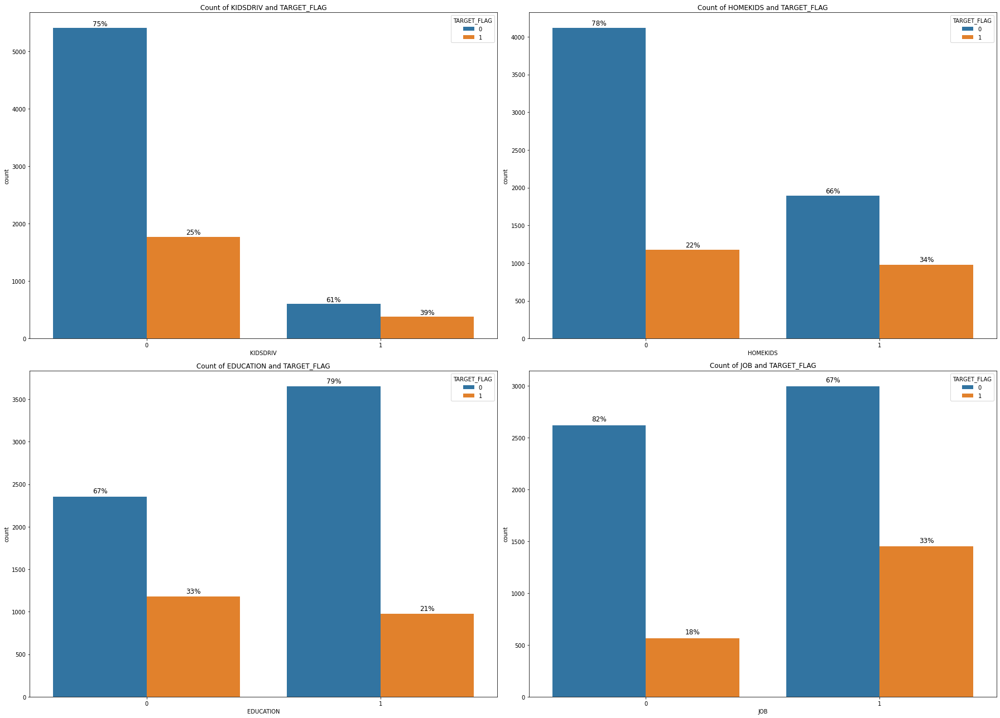

In [37]:
object_columns = [ 'KIDSDRIV', 'HOMEKIDS',  'EDUCATION', 'JOB']

fig, axes = plt.subplots(2,2, figsize=(25,18))

for name, ax in zip(object_columns, axes.flatten()):
  sns.countplot(ax = ax, data= df, x= name, hue= "TARGET_FLAG")   
  ax.set_title("Count of "+name+" and TARGET_FLAG") 
  show_percentage(ax)
plt.tight_layout()

#plt.show()


In [38]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

numerical_columns= numerical_features
binary_columns=['PARENT1', 'MSTATUS', 'SEX', 'CAR_USE', 
                'RED_CAR', 'REVOKED', 'URBANICITY', 'JOB',
                'KIDSDRIV', 'HOMEKIDS', 'EDUCATION']
cat_columns=['CAR_TYPE']


preprocessor3 = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_columns),
        ('bin', binary_transformer, binary_columns),
        ('cat', categorical_transformer, cat_columns)])

X_df=df
y = X_df.TARGET_FLAG
X_df = X_df.drop(columns=['INDEX','TARGET_FLAG', 'TARGET_AMT'])
random_state = 1
X_train, X_test, y_train,y_test = train_test_split(X_df, y, test_size=0.3, random_state=random_state)


clf3 = Pipeline(steps=[('preprocessor', preprocessor3),
                      ('classifier', RandomForestClassifier(class_weight="balanced"))])
clf3.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  Pipeline(memory=None,
                                                           steps=[('transformer',
                                                                   FunctionTransformer(accept_sparse=False,
                                                                                       check_inverse=True,
                                                                                       func=<function dollar_transform at 0x7f0f2f5e7290>,
                                                                                       inv_kw_args=None,
                                                                                       inve

In [39]:
y_pred = clf3.predict(X_test)
cv_score = cross_val_score(clf3, X_df, y, cv=10, scoring='roc_auc')
print("=== Confusion Matrix ===")
print(confusion_matrix(y_test, y_pred))
print('\n')
print("=== Classification Report ===")
print(classification_report(y_test, y_pred))
print('\n')
print("=== All AUC Scores ===")
print(cv_score)
print('\n')
print("=== Mean AUC Score ===")
print("Mean AUC Score - Random Forest: ", cv_score.mean())
ac["modified_data_Random_Forest"] = cv_score.mean()


=== Confusion Matrix ===
[[1709   94]
 [ 435  211]]


=== Classification Report ===
              precision    recall  f1-score   support

           0       0.80      0.95      0.87      1803
           1       0.69      0.33      0.44       646

    accuracy                           0.78      2449
   macro avg       0.74      0.64      0.65      2449
weighted avg       0.77      0.78      0.75      2449



=== All AUC Scores ===
[0.8060293  0.79575514 0.81377549 0.83049569 0.77695314 0.80294084
 0.81340789 0.82936192 0.79917052 0.78825231]


=== Mean AUC Score ===
Mean AUC Score - Random Forest:  0.8056142232679481


In [40]:
result = {}
for key in ac.keys():
    result[key] = [ac[key]]
result = pd.DataFrame.from_dict(result, orient="index")
result = result.rename(columns={0: "AUC"})
result.sort_values(by = 'AUC', ascending = False)

,AUC
Unbalanced_Random_Forest,0.810153
Balanced_Random_Forest,0.809501
modified_data_Random_Forest,0.805614


# Estimation over test data set

In [41]:
test_df=pd.read_csv('test_auto.csv')

In [42]:
test_df.head()

,INDEX,TARGET_FLAG,TARGET_AMT,KIDSDRIV,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,SEX,EDUCATION,JOB,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CAR_AGE,URBANICITY
0,3,NaN,NaN,0,48.0,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,"$21,970",1,Van,yes,$0,0,No,2,10.0,Highly Urban/ Urban
1,9,NaN,NaN,1,40.0,1,11.0,"$50,815",Yes,$0,z_No,M,z_High School,Manager,21,Private,"$18,930",6,Minivan,no,"$3,295",1,No,2,1.0,Highly Urban/ Urban
2,10,NaN,NaN,0,44.0,2,12.0,"$43,486",Yes,$0,z_No,z_F,z_High School,z_Blue Collar,30,Commercial,"$5,900",10,z_SUV,no,$0,0,No,0,10.0,z_Highly Rural/ Rural
3,18,NaN,NaN,0,35.0,2,NaN,"$21,204",Yes,$0,z_No,M,z_High School,Clerical,74,Private,"$9,230",6,Pickup,no,$0,0,Yes,0,4.0,z_Highly Rural/ Rural
4,21,NaN,NaN,0,59.0,0,12.0,"$87,460",No,$0,z_No,M,z_High School,Manager,45,Private,"$15,420",1,Minivan,yes,"$44,857",2,No,4,1.0,Highly Urban/ Urban


In [54]:
#test_df = test_df.drop(columns= ["TARGET_FLAG", "TARGET_AMT"])

y_pred = clf1.predict(test_df)
y_pred

/usr/local/lib/python3.7/dist-packages/sklearn/compose/_column_transformer.py:430: FutureWarning: Given feature/column names or counts do not match the ones for the data given during fit. This will fail from v0.24.
  FutureWarning)


array([0, 0, 0, ..., 0, 0, 0])

In [55]:
np.mean(y_pred) # The mean over the prediction

0.10976179355441383

In [57]:
y_proba = clf1.predict_proba(test_df)
y_proba

/usr/local/lib/python3.7/dist-packages/sklearn/compose/_column_transformer.py:430: FutureWarning: Given feature/column names or counts do not match the ones for the data given during fit. This will fail from v0.24.
  FutureWarning)


array([[0.94, 0.06],
       [0.59, 0.41],
       [0.81, 0.19],
       ...,
       [0.96, 0.04],
       [0.74, 0.26],
       [0.84, 0.16]])

# Conclusion


To evaluate models we did concentrate on AUC metric, which an interristing metric to use in our case. In fact, we want the number of False postive (predicted to be 0 but in fact it's a 1) to be minimal since it will cost us more.

the performance of our models are similar in term of AUC metric.

to ameliorate and to enhance the models performance we can try more data engineers methods, especially features selection or Dimentionality reduction. 